# Generic forecast skill

This notebook contains plots showing the skill of commonly assessed variables and indices. Results are shown for CAFE-f6 and for the CanESM5 and EC-Earth3 CMIP6 DCPP submissions. 30-year climatological and verification periods are used for both the CAFE-f6 and CMIP6 data. However, because the historical CMIP6 data end in 2014, these periods differ slightly: 1991-2020 for CAFE-f6; 1985-2014 for CanESM5 and EC-Earth3. Note also that the CanESM5 hindcasts are initialised at the end of December every year, while the CAFE-f6 and EC-Earth3 hindcasts are initialised at the beginning of November every year.

Significant points (as identified by a non-parametric block bootstrapping procedure) are shown by hatching for the maps and filled circles for the line plots.

If you wish to see anything added to these results, please contact Dougie.

In [1]:
import warnings

warnings.filterwarnings("ignore")

import cftime

import xarray as xr

import xskillscore as xs

import matplotlib.pyplot as plt

import cartopy.crs as ccrs

from src import utils, plot

from notebook_helper import plot_metrics, plot_metric_maps, plot_hindcasts

In [2]:
%load_ext autoreload
%autoreload 2
%load_ext lab_black

## Sea surface temperature relative to HadISST

### Global average (60°S - 60°N) hindcast timeseries

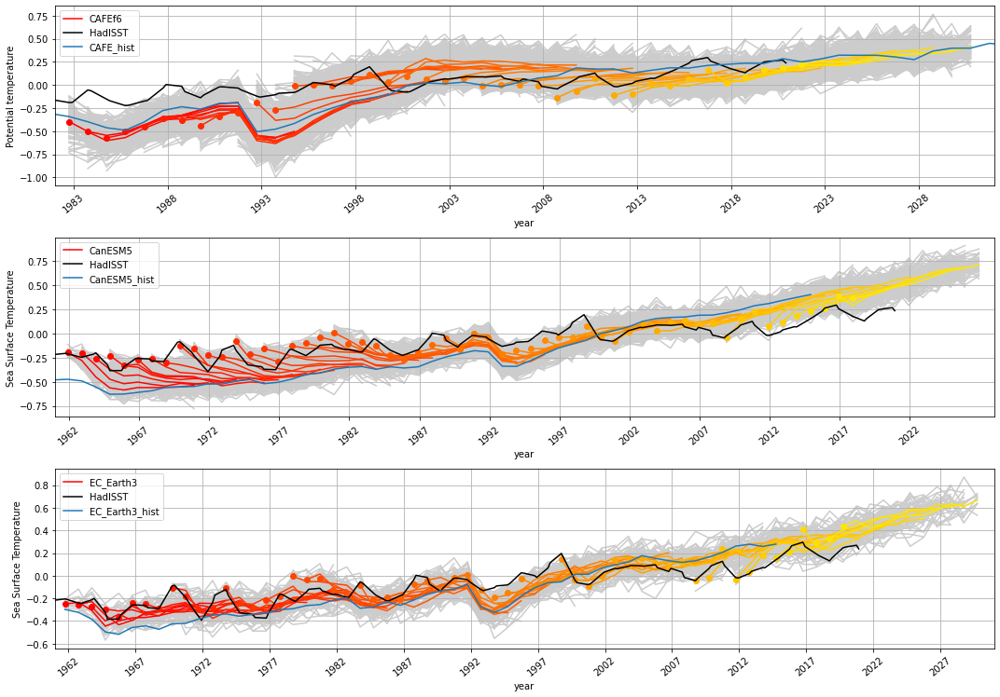

In [3]:
plot_hindcasts(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    ["CAFE_hist", "CanESM5_hist", "EC_Earth3_hist"],
    ["HadISST"],
    "annual",
    "sst",
    "global",
)

### Anomaly correlation coefficient

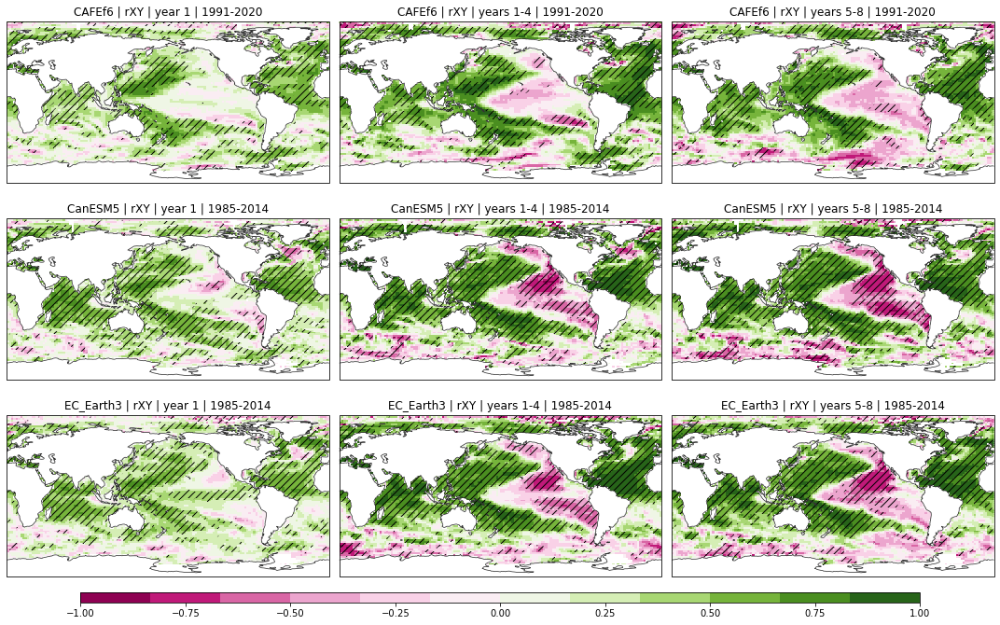

In [4]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "sst", "rXY")

#### What are those big patches of negative correlation in the Pacific the 4-year averages?
These aren't apparent in the CanESM5 verification paper. Are they an artifact of differing "trends" over the short verifcation period? Let's look at the skill of CanESM5 and EC_Earth3 over a longer (1971-2017) period of time

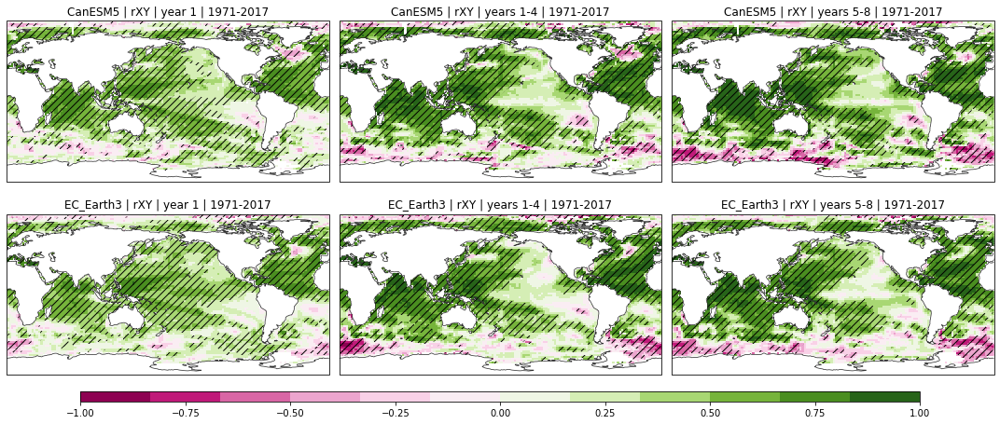

In [5]:
_ = plot_metric_maps(
    ["CanESM5", "EC_Earth3"], "HadISST", "sst", "rXY", verif_period="1971-2017"
)

This looks more like the results in the CanESM5 verification paper. So we need to be pretty careful interpretting the anomaly correlation coefficient over our short verification period. Let's demonstrate this by looking at the hindcast and observed timeseried at a location in the Pacific:

In [6]:
location = dict(lon=225, lat=10)
full_period = slice("1971", "2017")
verif_period = slice("1985", "2014")

hcst = xr.open_zarr(
    "../data/processed/CanESM5.4-year.anom_1985-2014.sst_global.zarr"
).sel(location, method="nearest")
hcst = (
    hcst["sst"]
    .mean("member")
    .sel(lead=59)
    .swap_dims({"init": "time"})
    .sel(time=full_period)
)

obsv = xr.open_zarr(
    "../data/processed/HadISST.4-year.anom_1985-2014.sst_global.zarr"
).sel(location, method="nearest")
obsv = obsv["sst"].sel(time=hcst.time)

acc_full_period = xs.pearson_r(hcst, obsv, dim="time").values.item()

acc_verif_period = xs.pearson_r(
    hcst.sel(time=verif_period), obsv.sel(time=verif_period), dim="time"
).values.item()

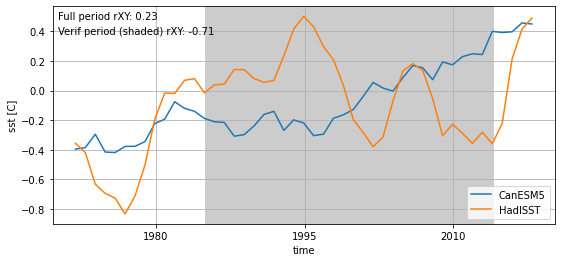

In [7]:
fig, ax = plt.subplots(figsize=(9, 4))

hcst.plot(label="CanESM5")
obsv.plot(label="HadISST")
ylim = plt.gca().get_ylim()
plt.fill_between(
    [cftime.datetime(1985, 1, 1), cftime.datetime(2014, 1, 1)],
    [ylim[0], ylim[0]],
    [ylim[1], ylim[1]],
    color=[0.8, 0.8, 0.8],
)
plt.gca().set_ylim(ylim)
plt.title("")
plt.legend(loc="lower right")
plt.grid()

plt.text(
    0.01,
    0.98,
    f"Full period rXY: {acc_full_period:.2f}",
    horizontalalignment="left",
    verticalalignment="top",
    transform=ax.transAxes,
)
_ = plt.text(
    0.01,
    0.91,
    f"Verif period (shaded) rXY: {acc_verif_period:.2f}",
    horizontalalignment="left",
    verticalalignment="top",
    transform=ax.transAxes,
)

### Initialised component of the anomaly correlation coefficient
(see https://doi.org/10.1029/2019GL086361)

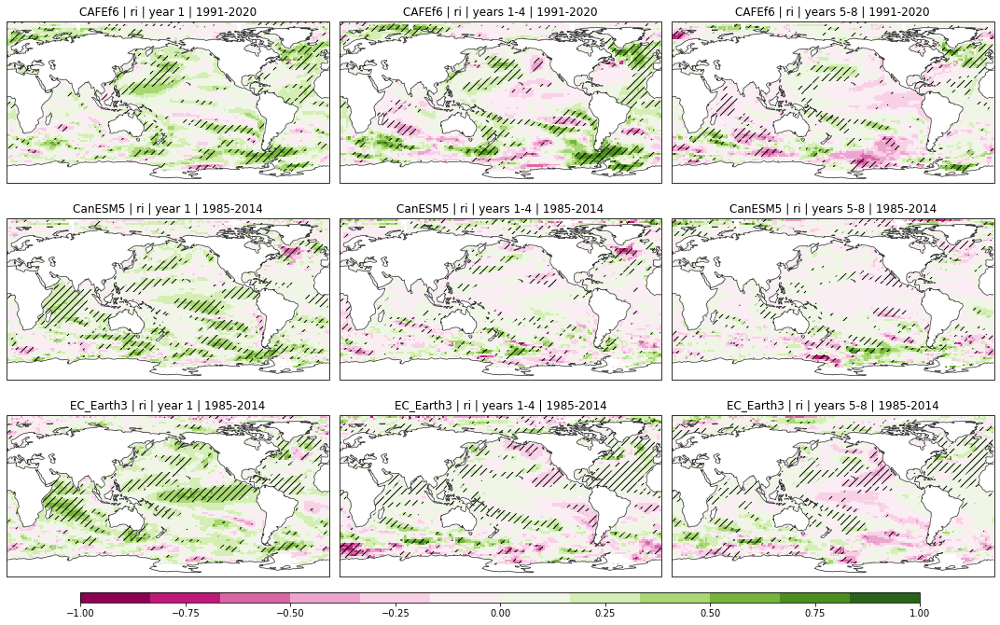

In [8]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "sst", "ri")

### Mean squared skill score relative to climatology

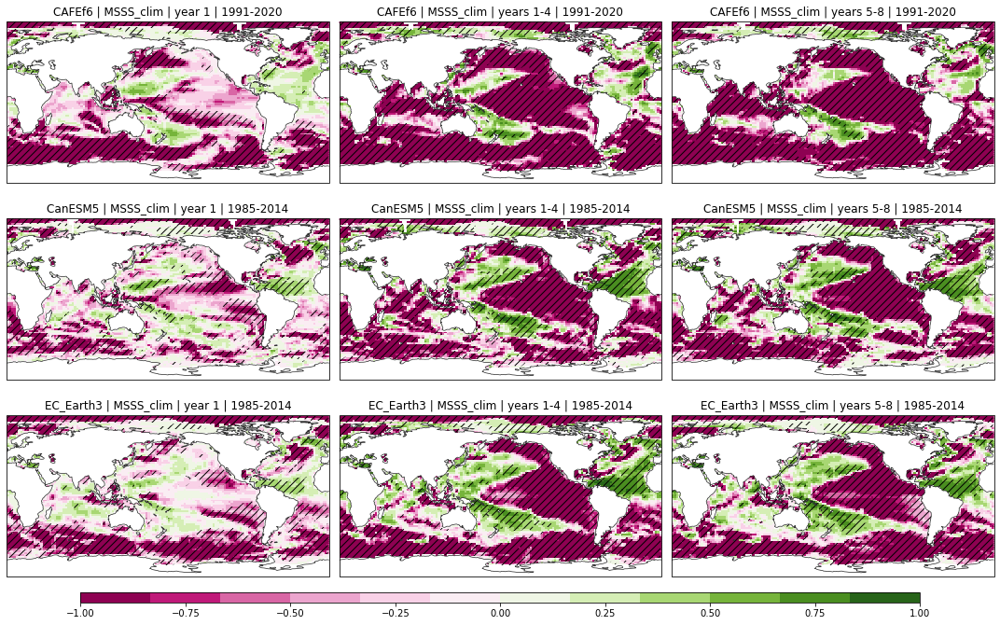

In [9]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "sst", "MSSS_clim")

### Mean squared skill score relative to historical simulations

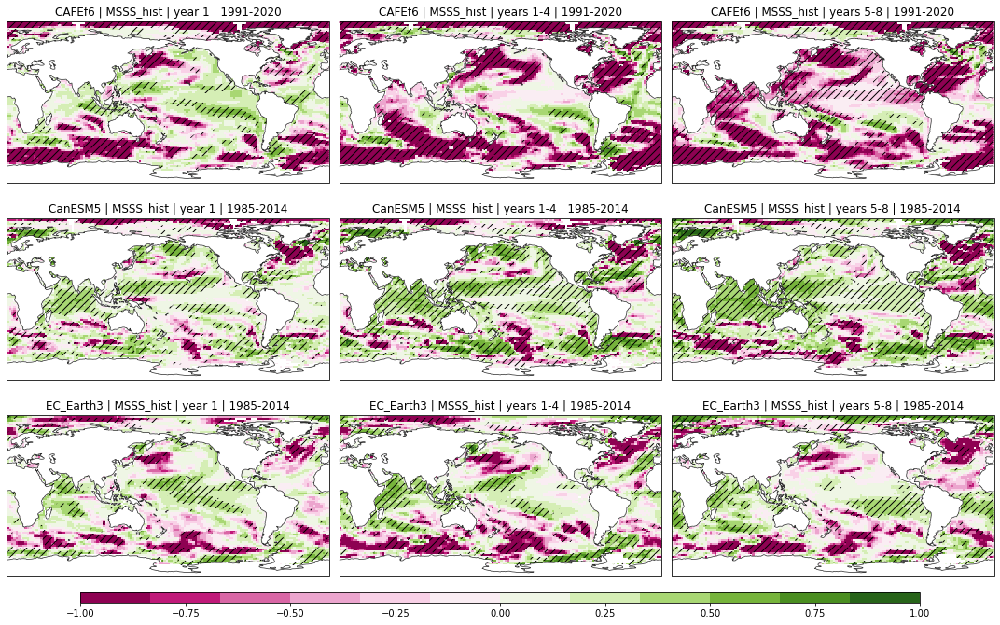

In [10]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "sst", "MSSS_hist")

### Where is the MSSS positive relative to both climatology and historical simulations?
Lighter green indicates both are positive; darker green indicates both are positive and significant

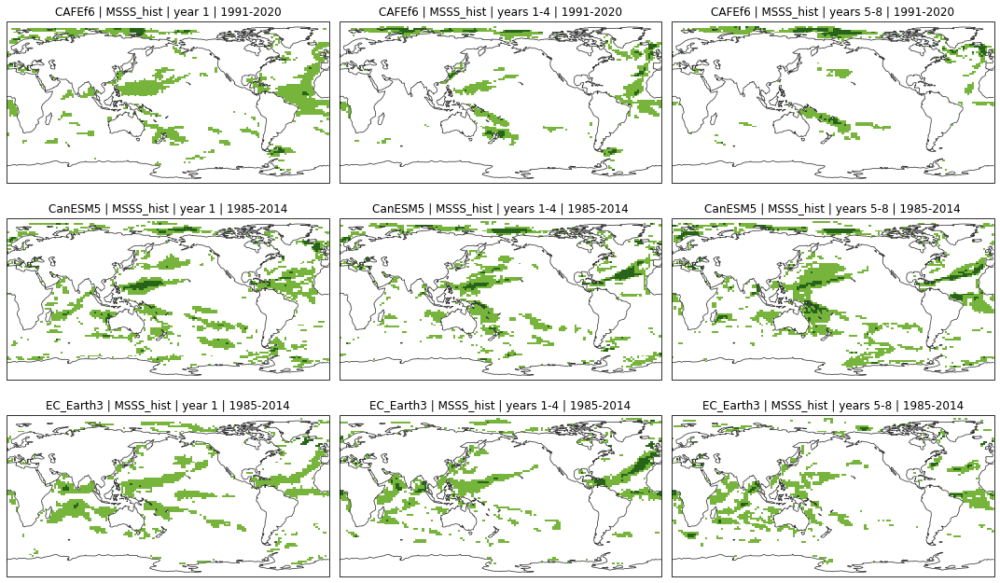

In [11]:
_ = plot_metric_maps(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "sst", ["MSSS_clim", "MSSS_hist"]
)

### Rank probability skill score relative to historical simulations

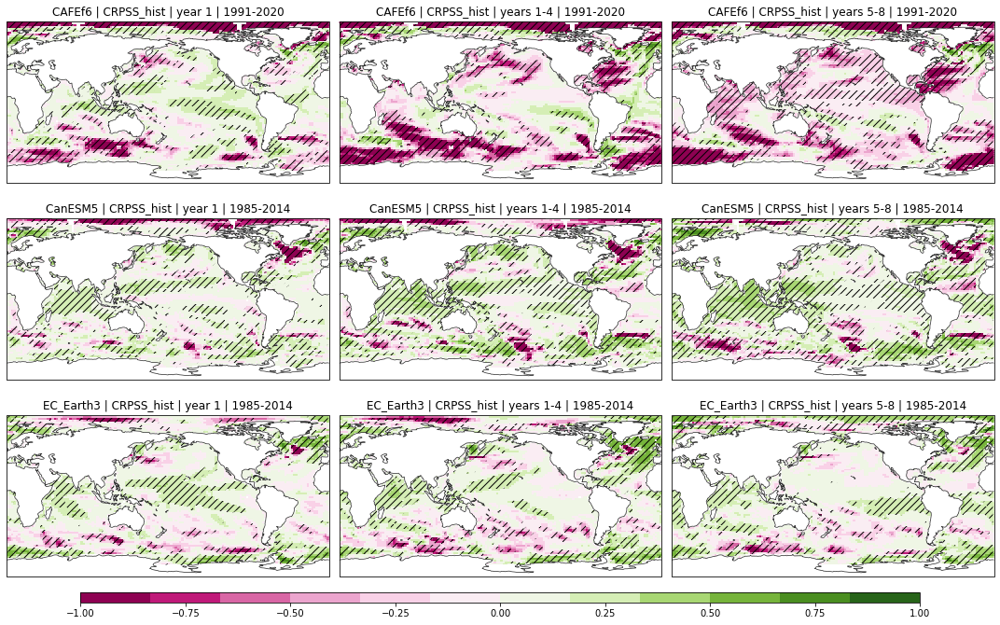

In [12]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "sst", "CRPSS_hist")

## Near-surface (2m) temperature relative to JRA55

### Global average (60°S - 60°N) hindcast timeseries

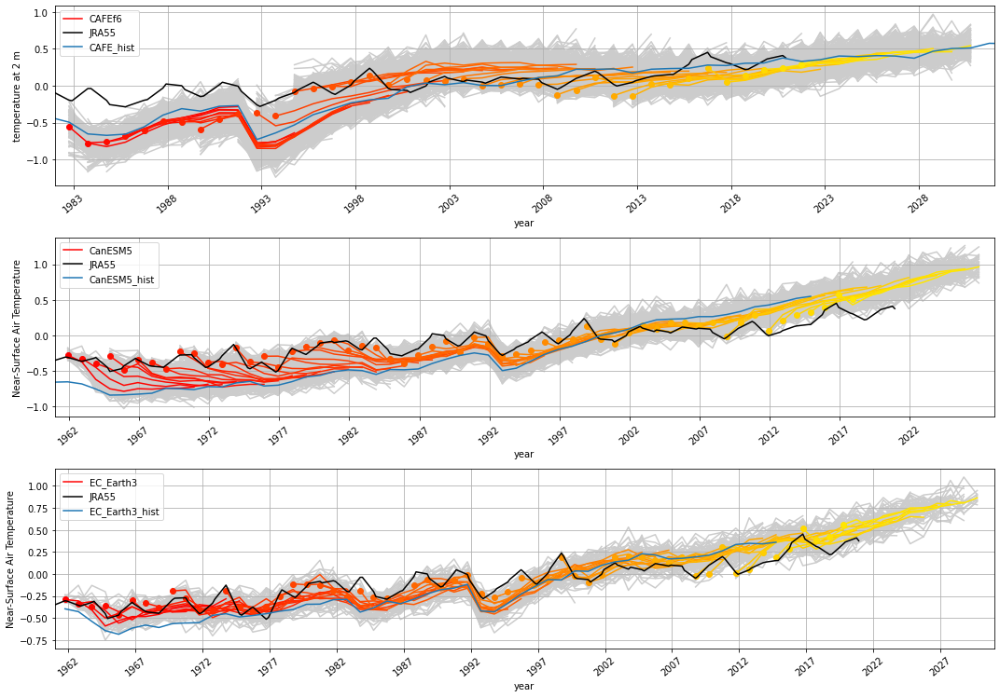

In [13]:
plot_hindcasts(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    ["CAFE_hist", "CanESM5_hist", "EC_Earth3_hist"],
    ["JRA55"],
    "annual",
    "t_ref",
    "global",
)

### Anomaly correlation coefficient

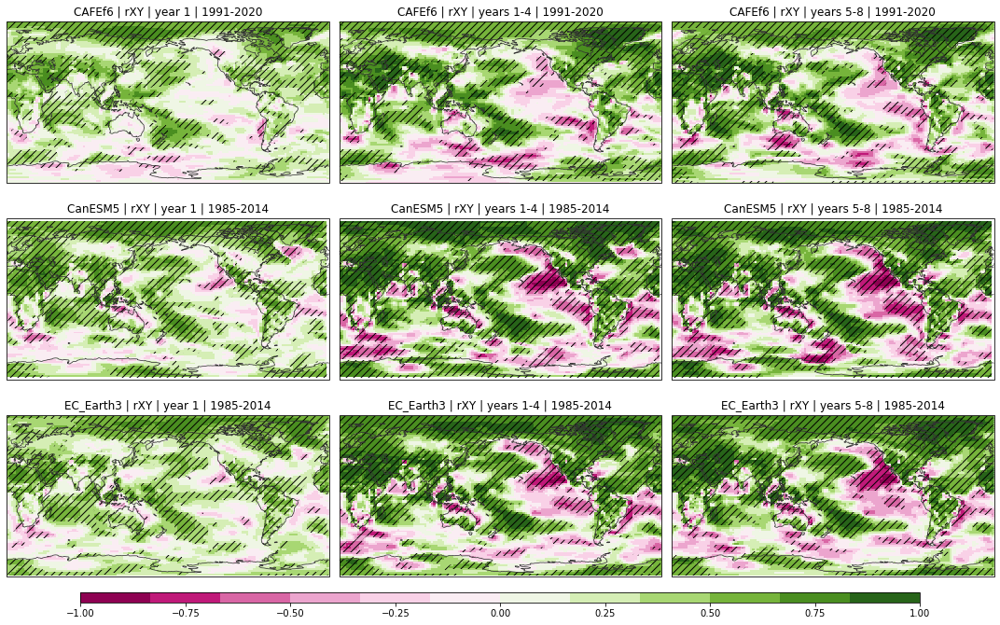

In [14]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "JRA55", "t_ref", "rXY")

### Initialised component of the anomaly correlation coefficient
(see https://doi.org/10.1029/2019GL086361)

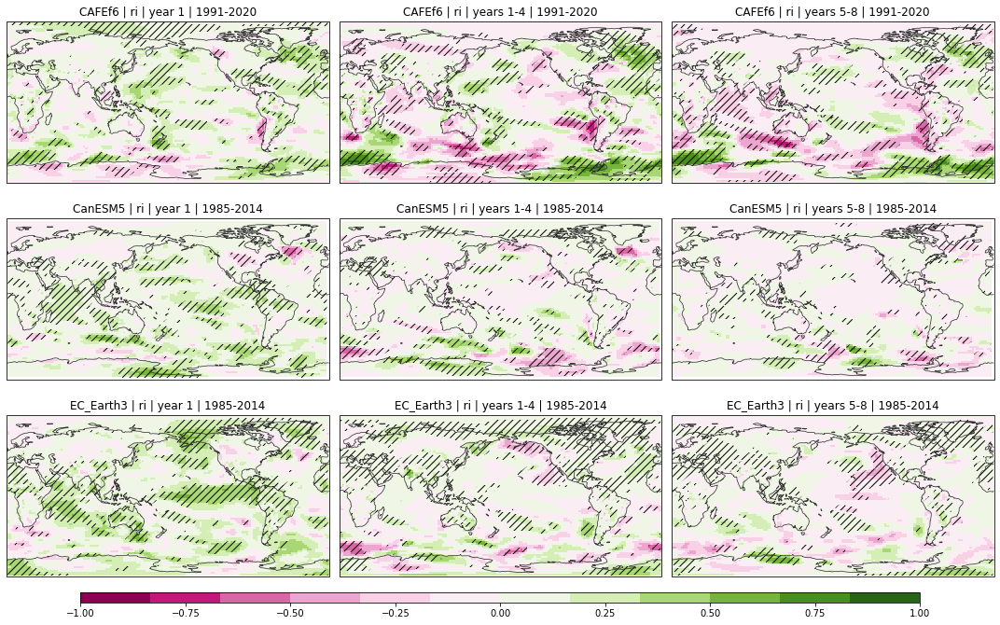

In [15]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "JRA55", "t_ref", "ri")

### Mean squared skill score relative to climatology

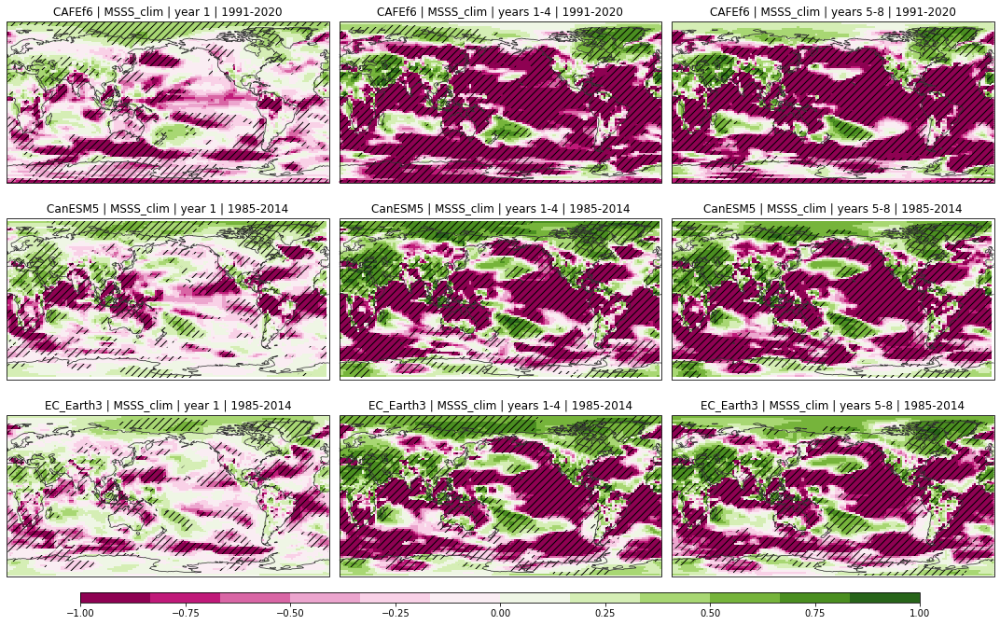

In [16]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "JRA55", "t_ref", "MSSS_clim")

### Mean squared skill score relative to historical simulations

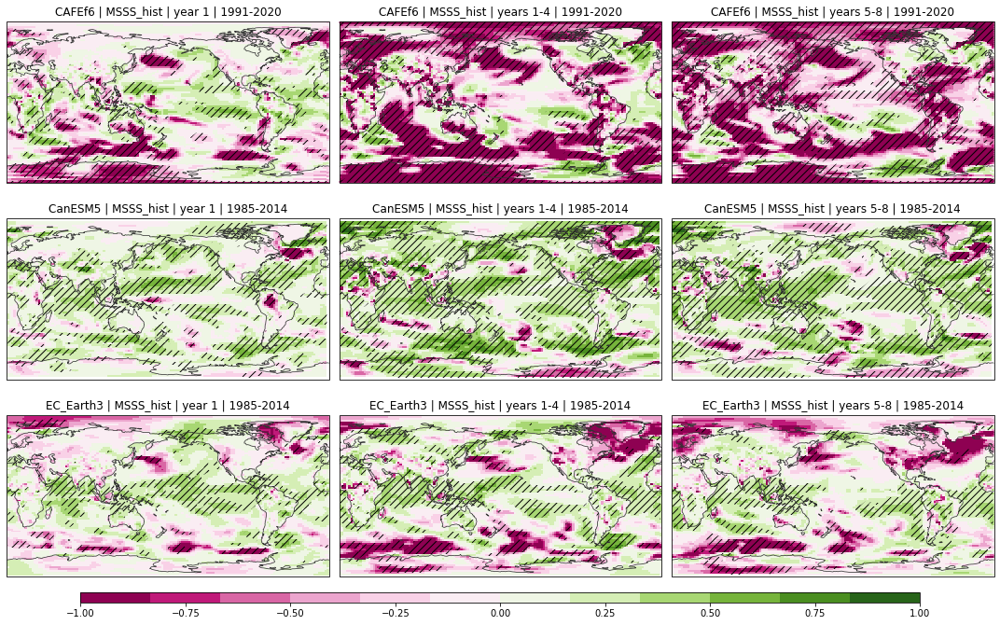

In [17]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "JRA55", "t_ref", "MSSS_hist")

### Where is the MSSS positive relative to both climatology and historical simulations?
Lighter green indicates both are positive; darker green indicates both are positive and significant

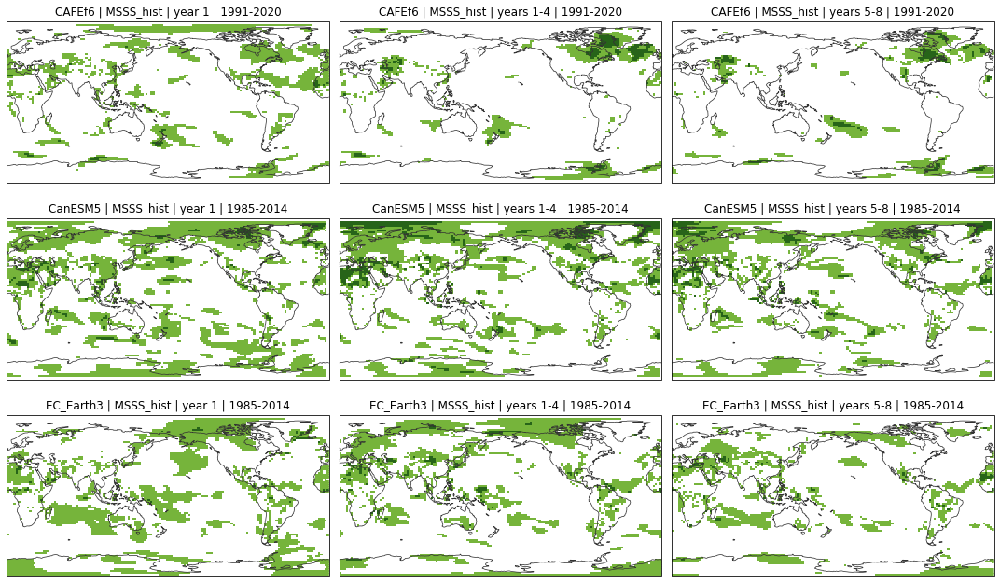

In [18]:
_ = plot_metric_maps(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "JRA55", "t_ref", ["MSSS_clim", "MSSS_hist"]
)

### Rank probability skill score relative to historical simulations

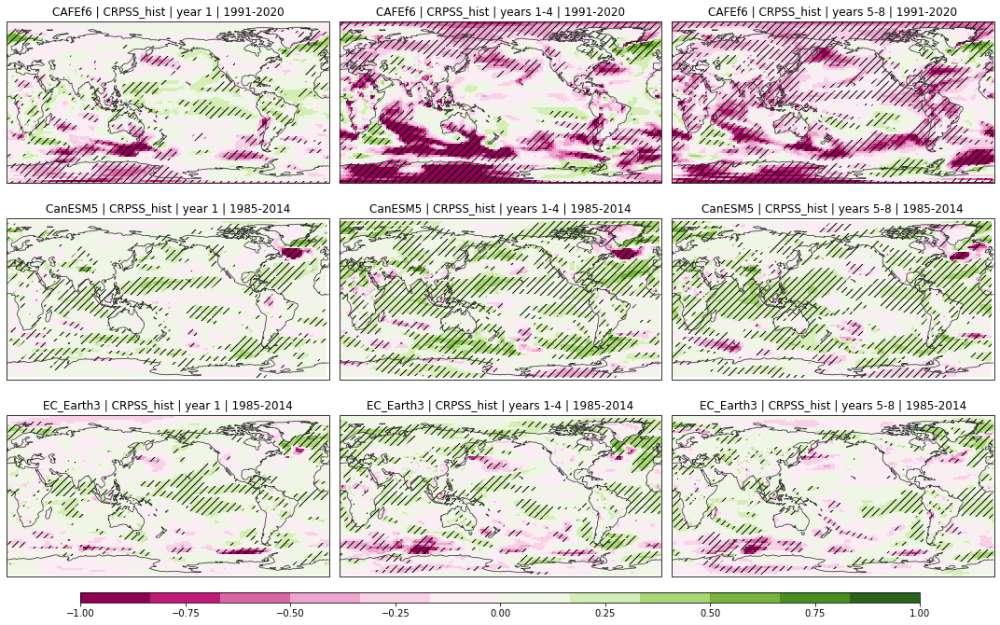

In [19]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "JRA55", "t_ref", "CRPSS_hist")

## Precipitation relative to GPCP

### Global average (60°S - 60°N) hindcast timeseries

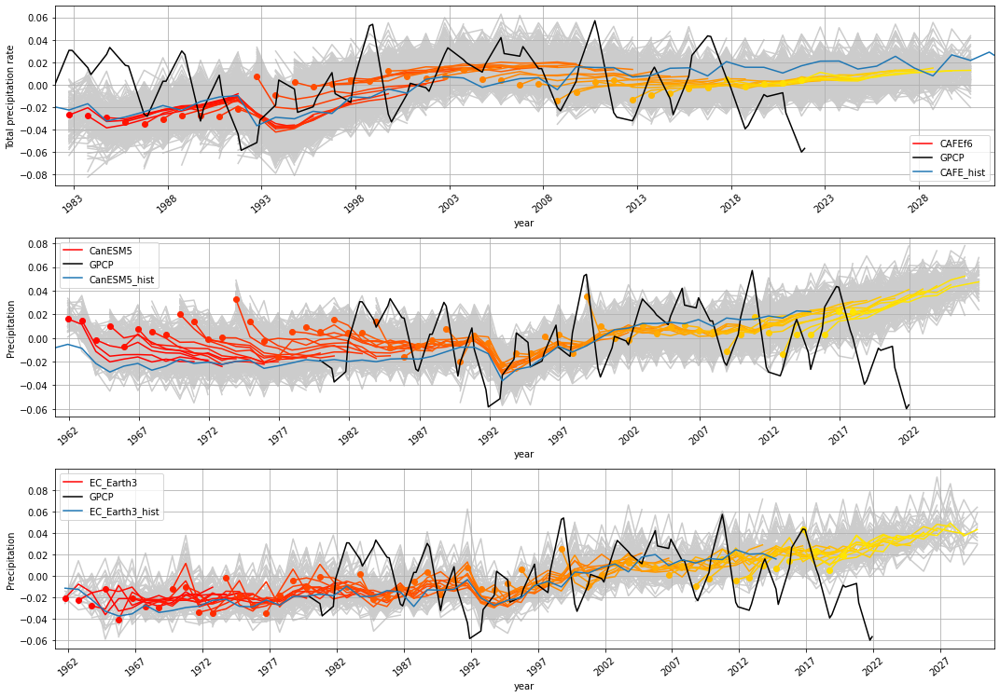

In [20]:
plot_hindcasts(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    ["CAFE_hist", "CanESM5_hist", "EC_Earth3_hist"],
    ["GPCP"],
    "annual",
    "precip",
    "global",
)

### Anomaly correlation coefficient

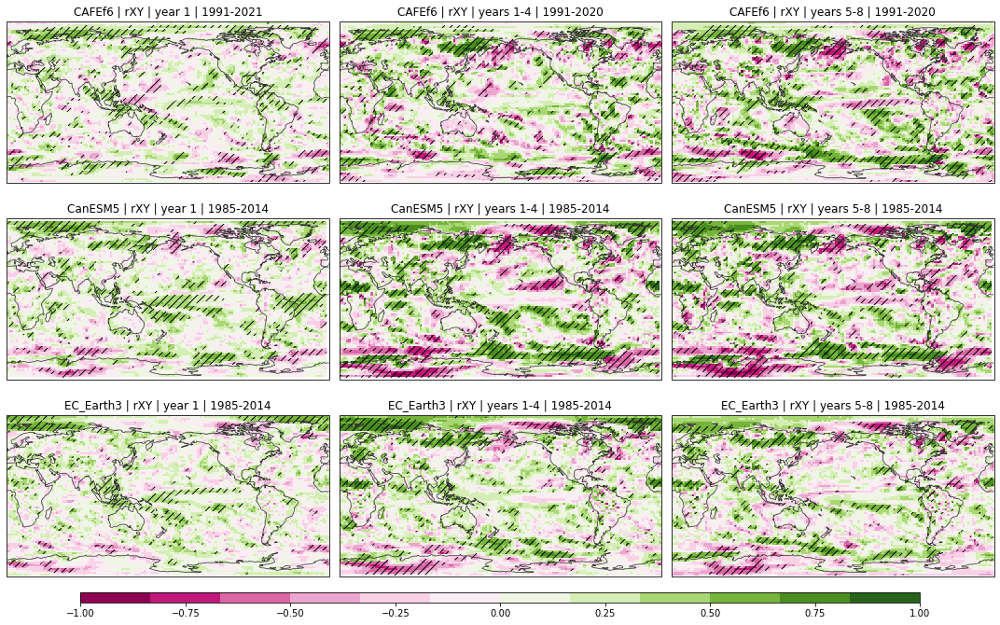

In [21]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "GPCP", "precip", "rXY")

### Initialised component of the anomaly correlation coefficient
(see https://doi.org/10.1029/2019GL086361)

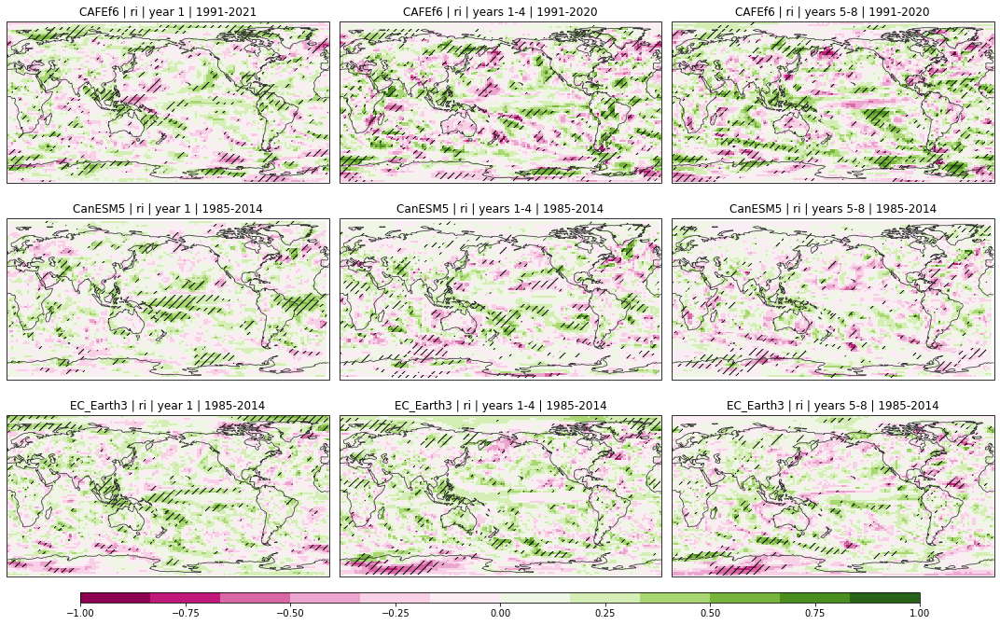

In [22]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "GPCP", "precip", "ri")

### Mean squared skill score relative to climatology

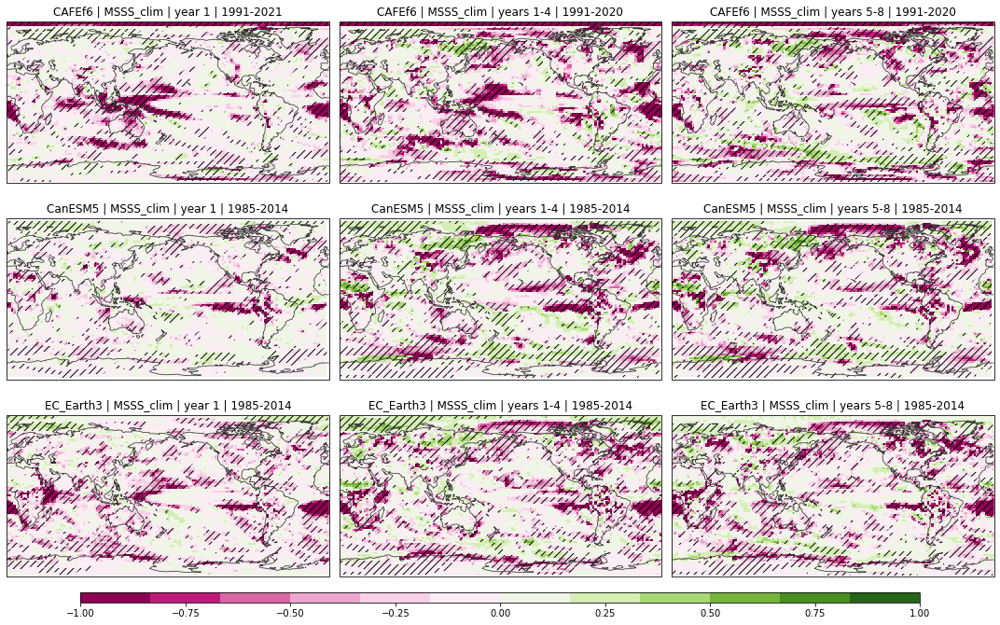

In [23]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "GPCP", "precip", "MSSS_clim")

### Mean squared skill score relative to historical simulations

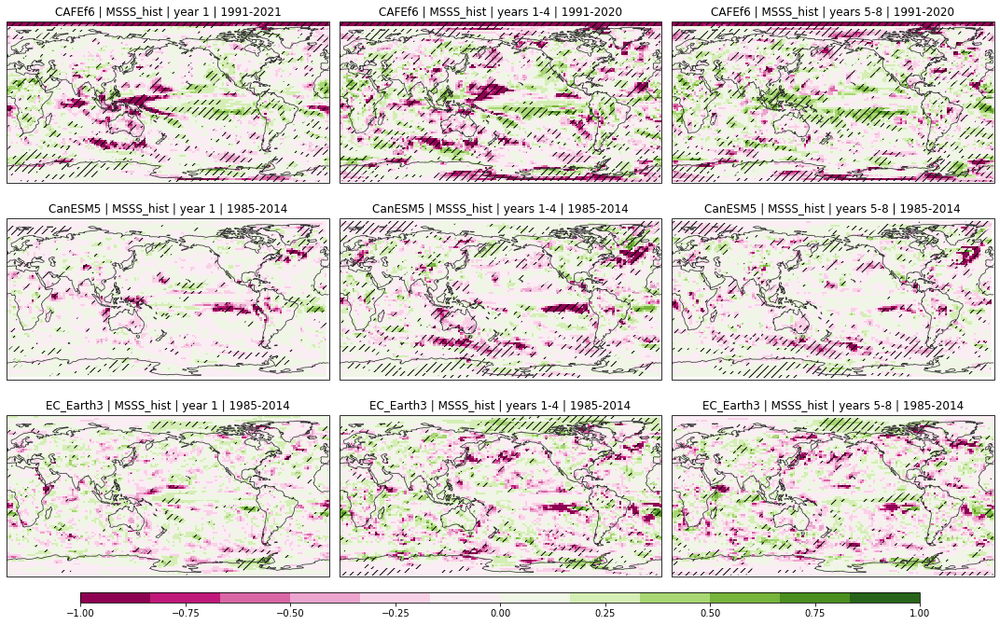

In [24]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "GPCP", "precip", "MSSS_hist")

### Where is the MSSS positive relative to both climatology and historical simulations?
Lighter green indicates both are positive; darker green indicates both are positive and significant

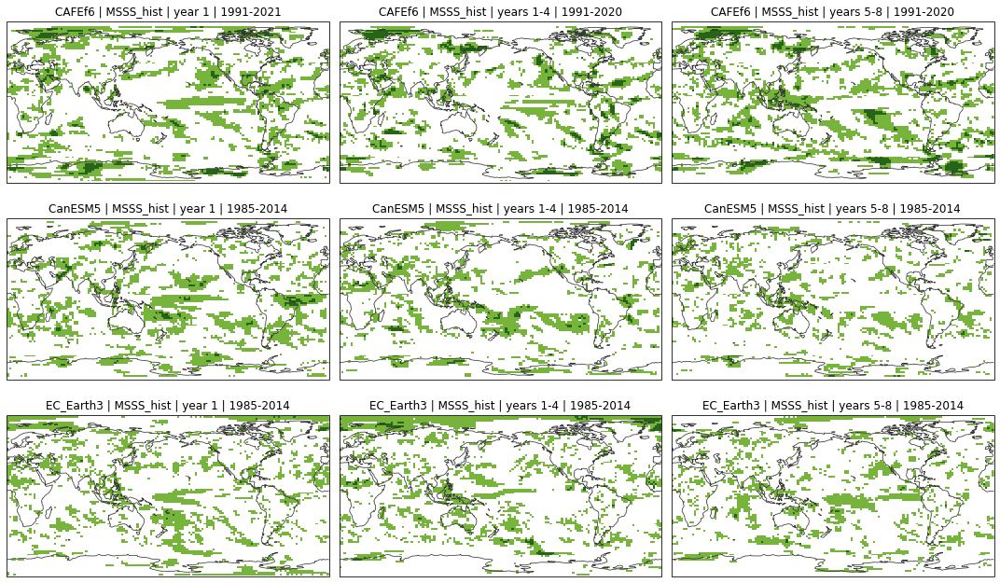

In [25]:
_ = plot_metric_maps(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "GPCP", "precip", ["MSSS_clim", "MSSS_hist"]
)

### Rank probability skill score relative to historical simulations

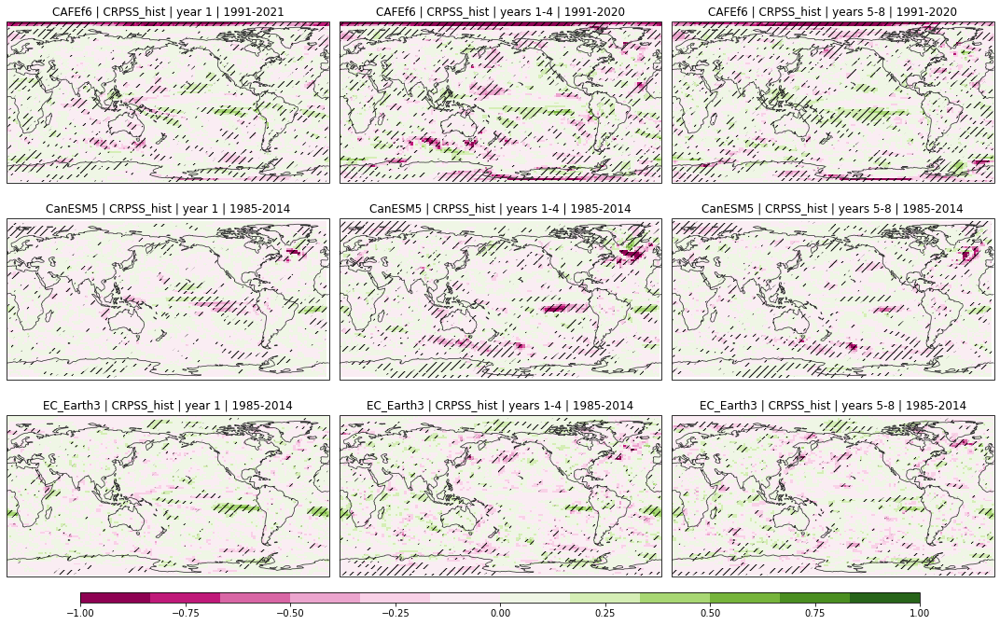

In [26]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "GPCP", "precip", "CRPSS_hist")

## Sea level pressure relati|ve to JRA55

### Global average (60°S - 60°N) hindcast timeseries

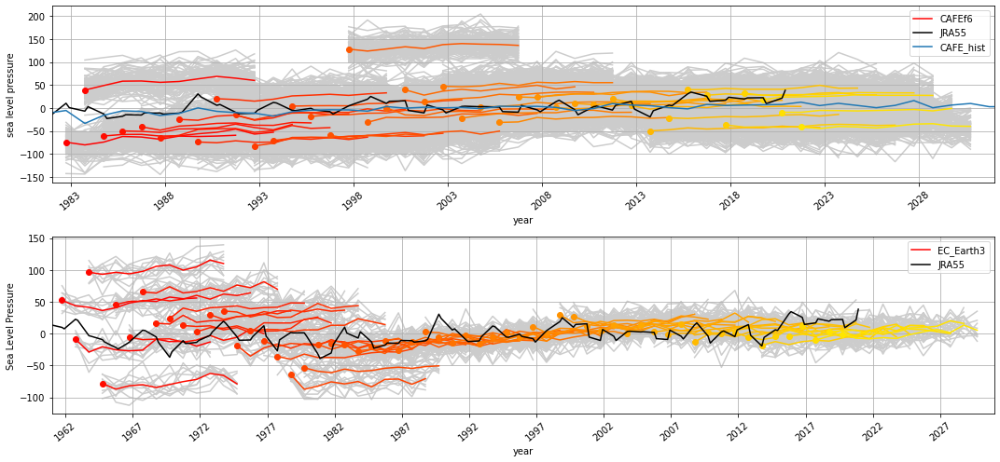

In [27]:
plot_hindcasts(
    ["CAFEf6", "EC_Earth3"],
    ["CAFE_hist"],
    ["JRA55"],
    "annual",
    "slp",
    "global",
)

### Anomaly correlation coefficient

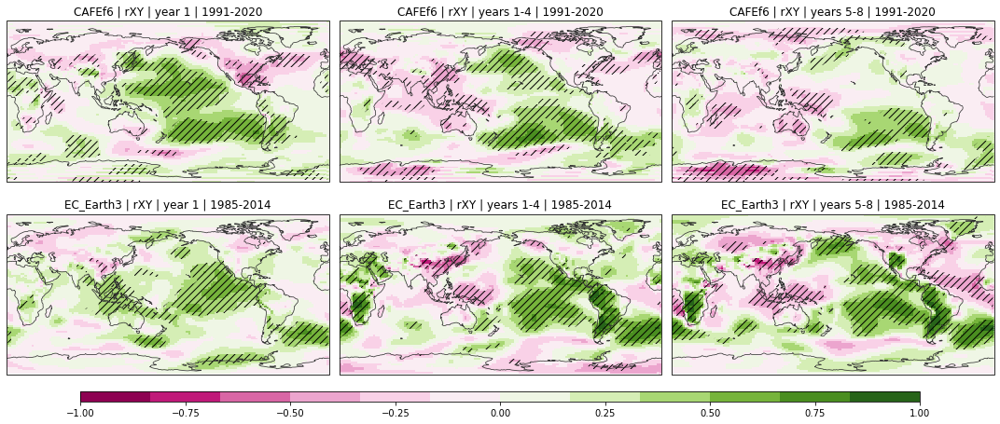

In [28]:
_ = plot_metric_maps(["CAFEf6", "EC_Earth3"], "JRA55", "slp", "rXY")

### Initialised component of the anomaly correlation coefficient
(see https://doi.org/10.1029/2019GL086361)

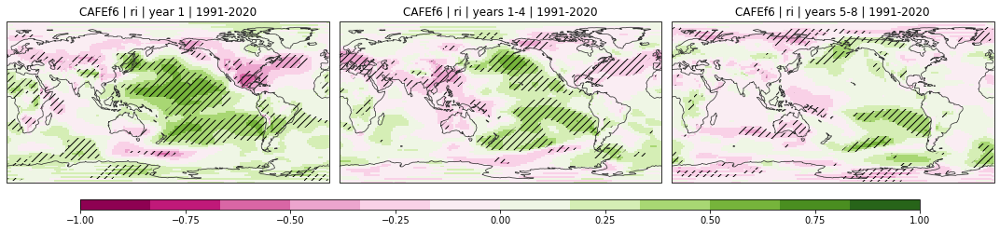

In [29]:
_ = plot_metric_maps(["CAFEf6"], "JRA55", "slp", "ri")

### Mean squared skill score relative to climatology

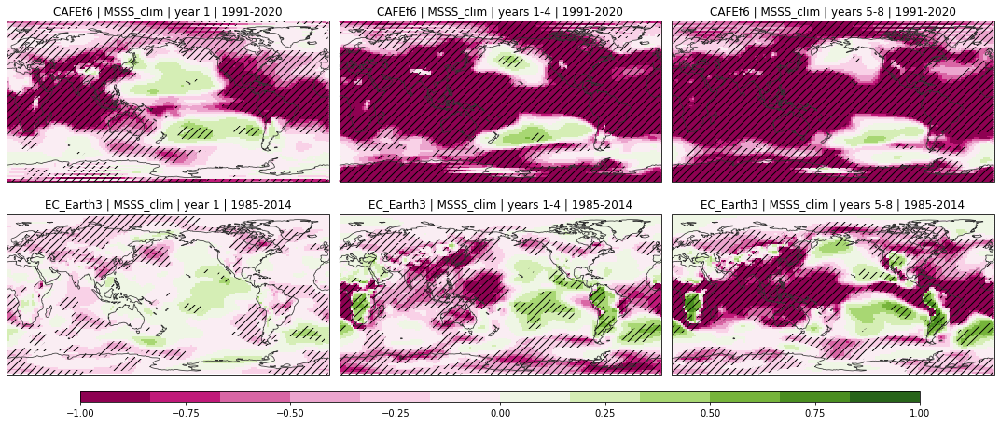

In [30]:
_ = plot_metric_maps(["CAFEf6", "EC_Earth3"], "JRA55", "slp", "MSSS_clim")

### Mean squared skill score relative to historical simulations

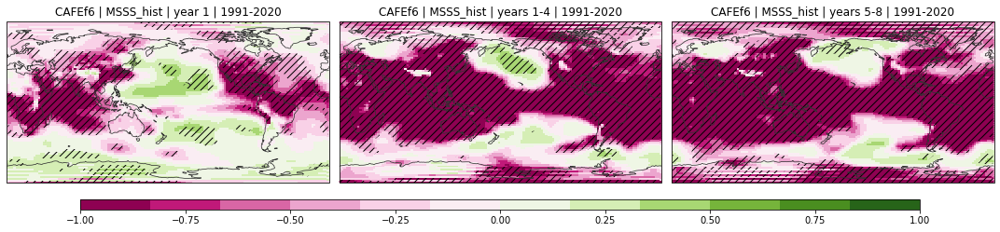

In [31]:
_ = plot_metric_maps(["CAFEf6"], "JRA55", "slp", "MSSS_hist")

### Where is the MSSS positive relative to both climatology and historical simulations?
Lighter green indicates both are positive; darker green indicates both are positive and significant

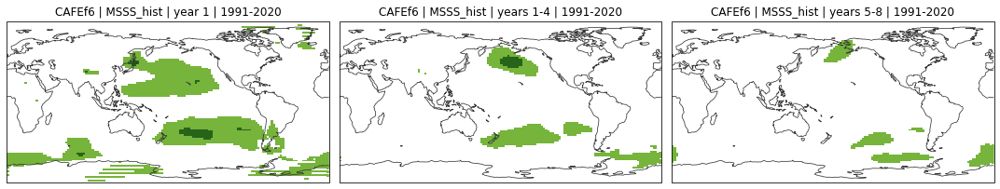

In [32]:
_ = plot_metric_maps(["CAFEf6"], "JRA55", "slp", ["MSSS_clim", "MSSS_hist"])

### Rank probability skill score relative to historical simulations

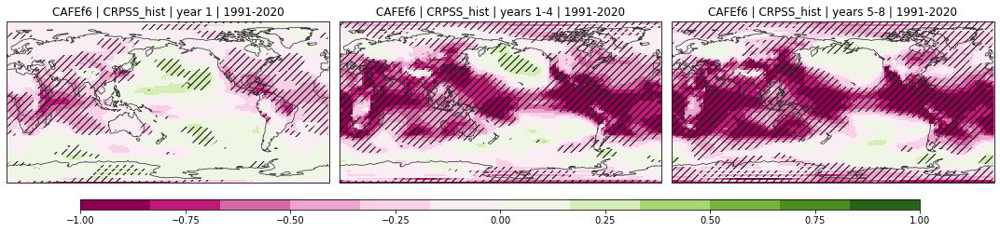

In [33]:
_ = plot_metric_maps(["CAFEf6"], "JRA55", "slp", "CRPSS_hist")

## Upper ocean heat content (upper 300m) relative to EN.4.2.2

### Global average (60°S - 60°N) hindcast timeseries

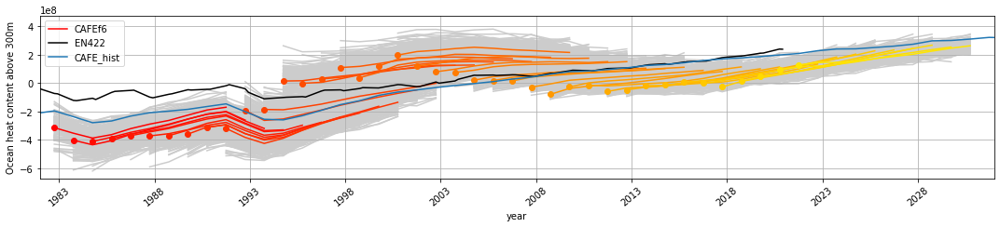

In [34]:
plot_hindcasts(
    ["CAFEf6"],
    ["CAFE_hist"],
    ["EN422"],
    "annual",
    "ohc300",
    "global",
)

### Anomaly correlation coefficient

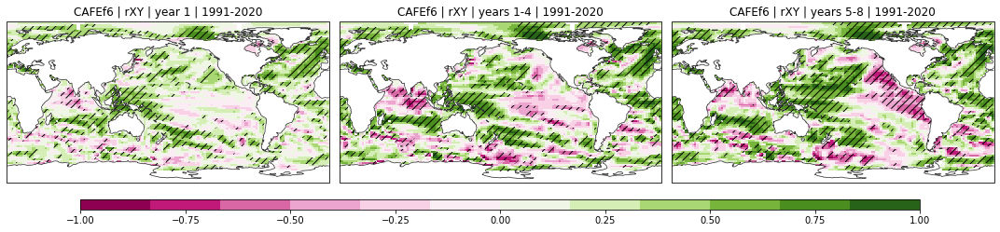

In [35]:
_ = plot_metric_maps(["CAFEf6"], "EN422", "ohc300", "rXY")

### Initialised component of the anomaly correlation coefficient
(see https://doi.org/10.1029/2019GL086361)

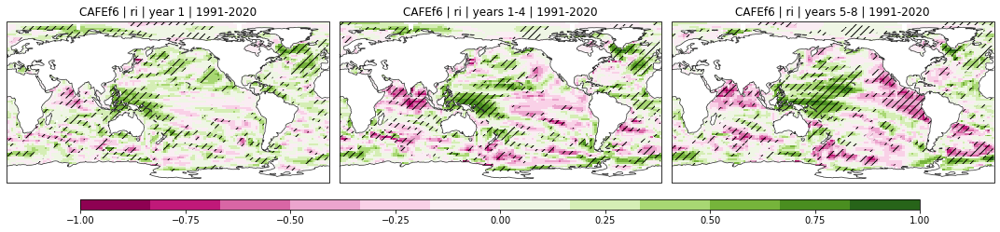

In [36]:
_ = plot_metric_maps(["CAFEf6"], "EN422", "ohc300", "ri")

### Mean squared skill score relative to climatology

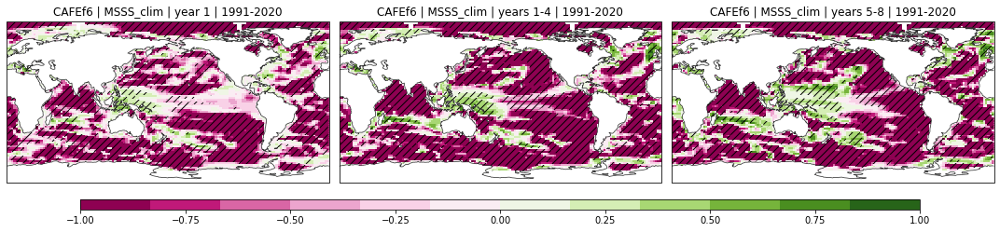

In [37]:
_ = plot_metric_maps(["CAFEf6"], "EN422", "ohc300", "MSSS_clim")

### Mean squared skill score relative to historical simulations

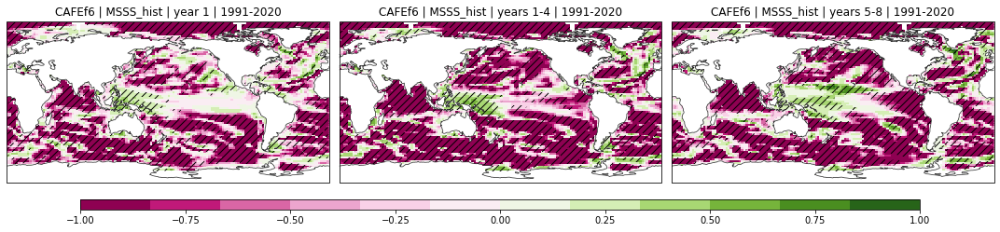

In [38]:
_ = plot_metric_maps(["CAFEf6"], "EN422", "ohc300", "MSSS_hist")

### Where is the MSSS positive relative to both climatology and historical simulations?
Lighter green indicates both are positive; darker green indicates both are positive and significant

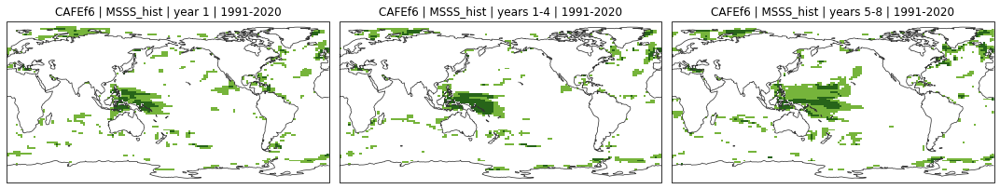

In [39]:
ohc300_fig = plot_metric_maps(["CAFEf6"], "EN422", "ohc300", ["MSSS_clim", "MSSS_hist"])

### Rank probability skill score relative to historical simulations

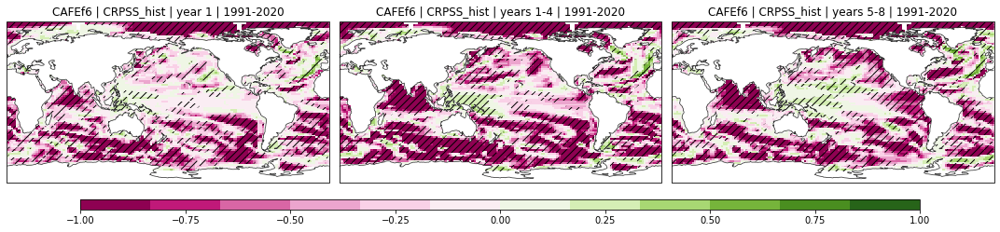

In [40]:
_ = plot_metric_maps(["CAFEf6"], "EN422", "ohc300", "CRPSS_hist")

### How do the hindcasts look in the region of positive and significant skill?

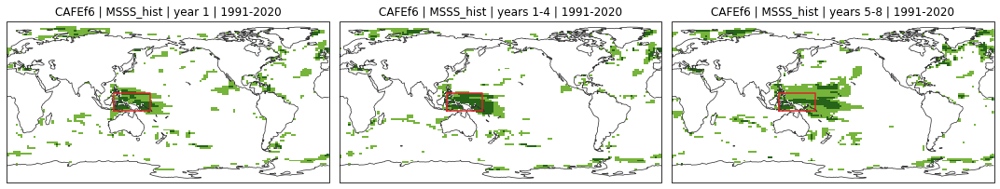

In [41]:
box = [120, 160, -10, 10]

for ax in ohc300_fig.axes:
    ax.plot(
        [box[0], box[1], box[1], box[0], box[0]],
        [box[2], box[2], box[3], box[3], box[2]],
        "C3",
        transform=ccrs.PlateCarree(),
    )
ohc300_fig

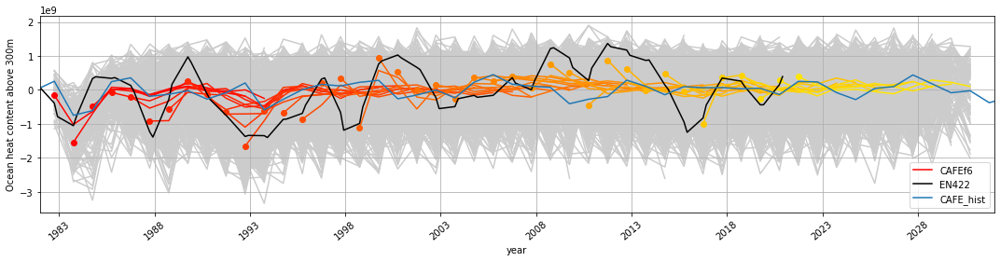

In [42]:
hcst = utils.average_over_lon_lat_box(
    xr.open_zarr("../data/processed/CAFEf6.annual.anom_1991-2020.ohc300_global.zarr"),
    box,
).compute()
hist = utils.average_over_lon_lat_box(
    xr.open_zarr(
        "../data/processed/CAFE_hist.annual.anom_1991-2020.ohc300_global.zarr"
    ),
    box,
).compute()
obsv = utils.average_over_lon_lat_box(
    xr.open_zarr("../data/processed/EN422.annual.anom_1991-2020.ohc300_global.zarr"),
    box,
).compute()

_ = plot.hindcasts({"CAFEf6": hcst}, {"EN422": obsv}, {"CAFE_hist": hist})

## El-Nino Southern Oscillation (via NINO 3.4) relative to HadISST

### Hindcast timeseries

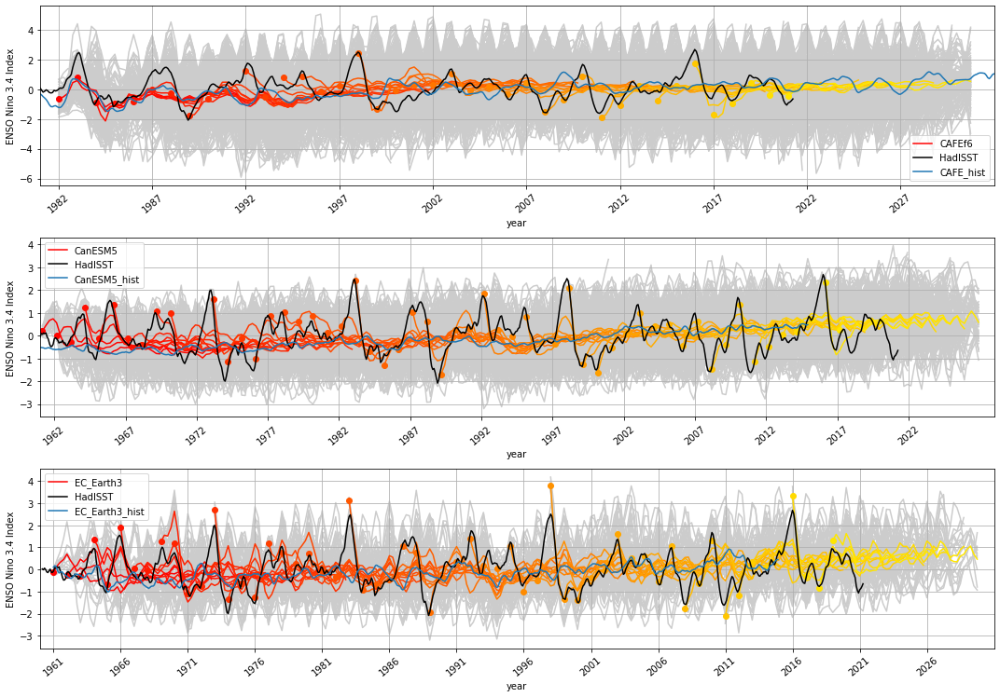

In [43]:
plot_hindcasts(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    ["CAFE_hist", "CanESM5_hist", "EC_Earth3_hist"],
    ["HadISST"],
    "3-month",
    "nino34",
)

### Anomaly correlation coefficient

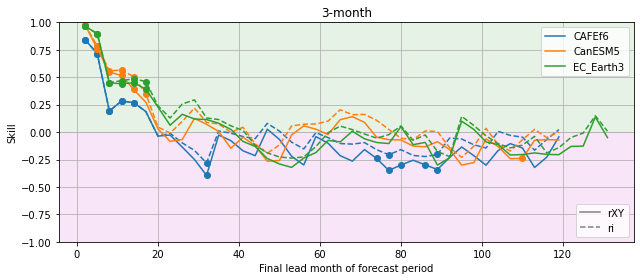

In [44]:
_ = plot_metrics(
)

### Mean squared skill score

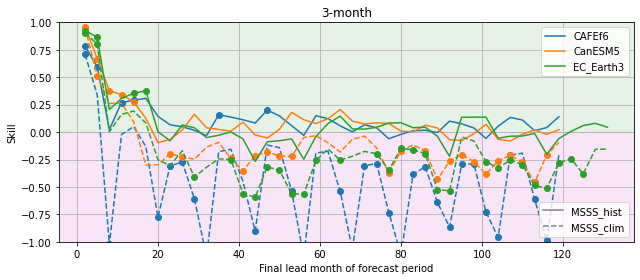

In [45]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    "HadISST",
    ["3-month"],
    "nino34",
    ["MSSS_hist", "MSSS_clim"],
)

### Rank probability skill score relative to historical simulations

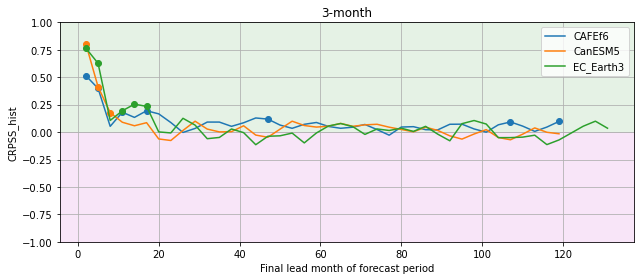

In [46]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", ["3-month"], "nino34", ["CRPSS_hist"]
)

## Indian Ocean Dipole (via DMI) relative to HadISST

### Hindcast timeseries

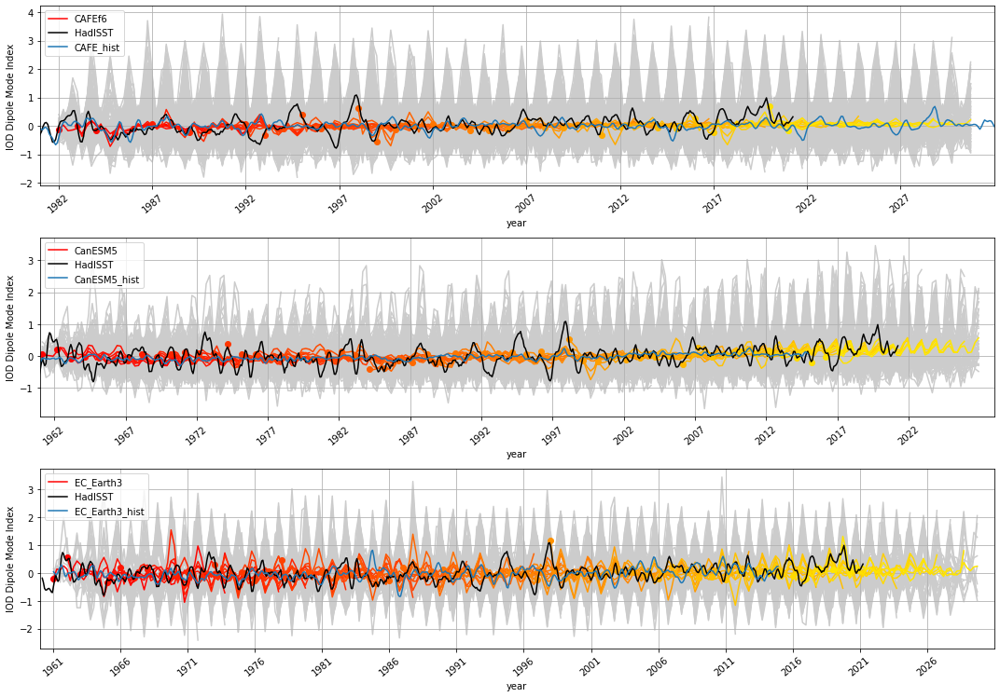

In [47]:
plot_hindcasts(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    ["CAFE_hist", "CanESM5_hist", "EC_Earth3_hist"],
    ["HadISST"],
    "3-month",
    "dmi",
)

### Anomaly correlation coefficient

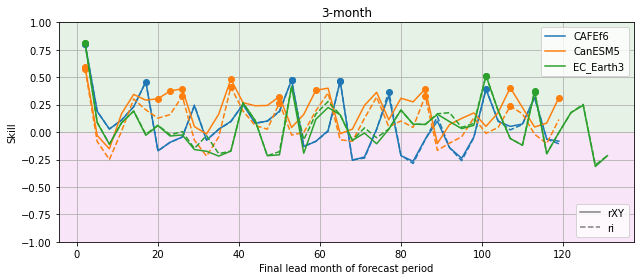

In [48]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", ["3-month"], "dmi", ["rXY", "ri"]
)

### Mean squared skill score

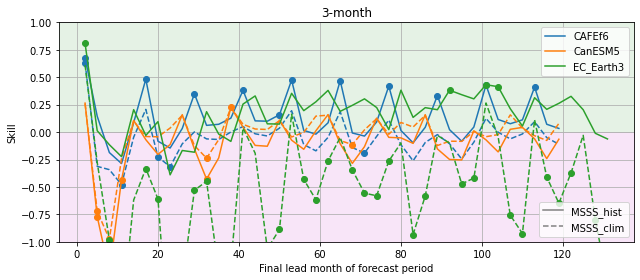

In [49]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    "HadISST",
    ["3-month"],
    "dmi",
    ["MSSS_hist", "MSSS_clim"],
)

### Rank probability skill score relative to historical simulations

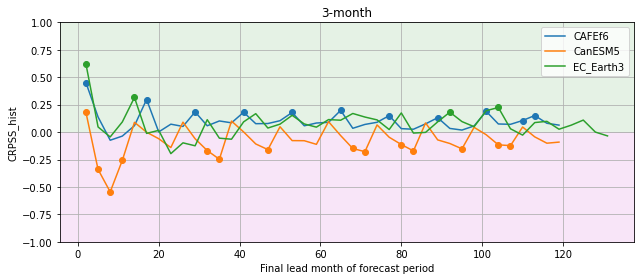

In [50]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", ["3-month"], "dmi", ["CRPSS_hist"]
)

## Southern Annual Mode (via Gong and Wang Index) relative to JRA55

### Hindcast timeseries

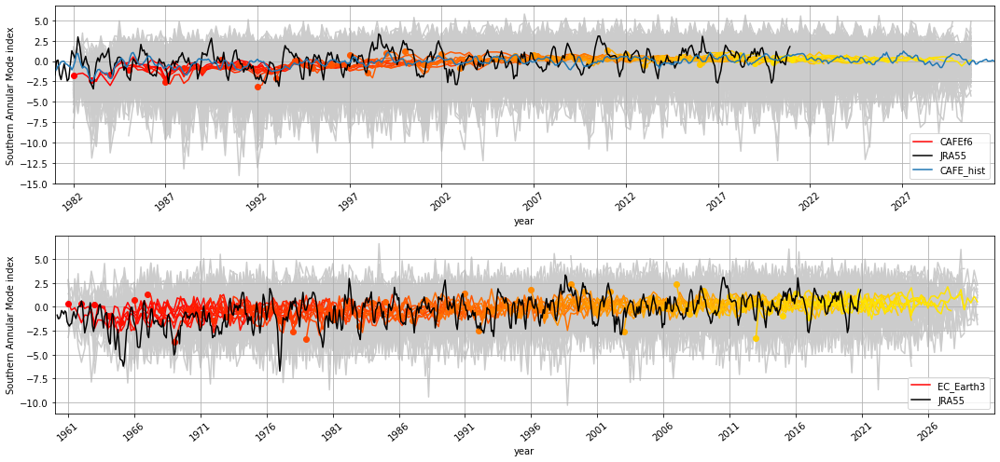

In [51]:
plot_hindcasts(
    ["CAFEf6", "EC_Earth3"],
    ["CAFE_hist"],
    ["JRA55"],
    "3-month",
    "sam",
)

### Anomaly correlation coefficient

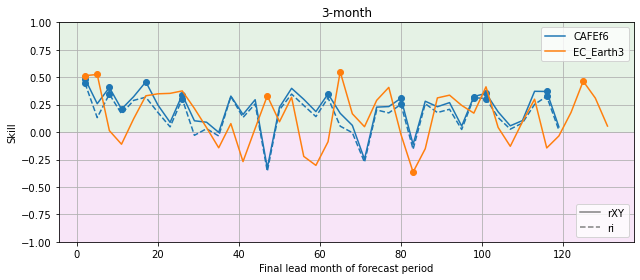

In [52]:
_ = plot_metrics(["CAFEf6", "EC_Earth3"], "JRA55", ["3-month"], "sam", ["rXY", "ri"])

### Mean squared skill score

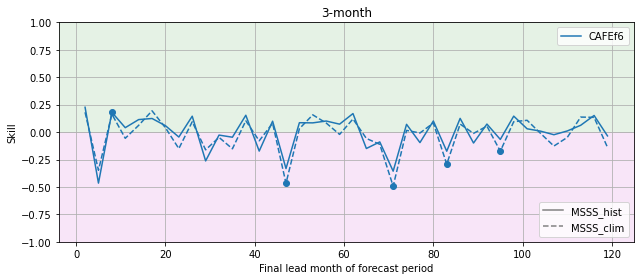

In [53]:
_ = plot_metrics(["CAFEf6"], "JRA55", ["3-month"], "sam", ["MSSS_hist", "MSSS_clim"])

### Rank probability skill score relative to historical simulations

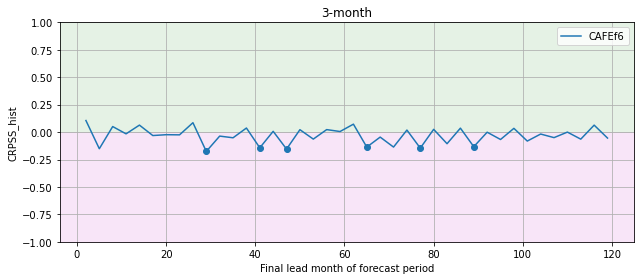

In [54]:
_ = plot_metrics(["CAFEf6"], "JRA55", ["3-month"], "sam", ["CRPSS_hist"])

## North Atlantic Oscillation Index (via Jianping and Wang Index) relative to JRA55

### Hindcast timeseries

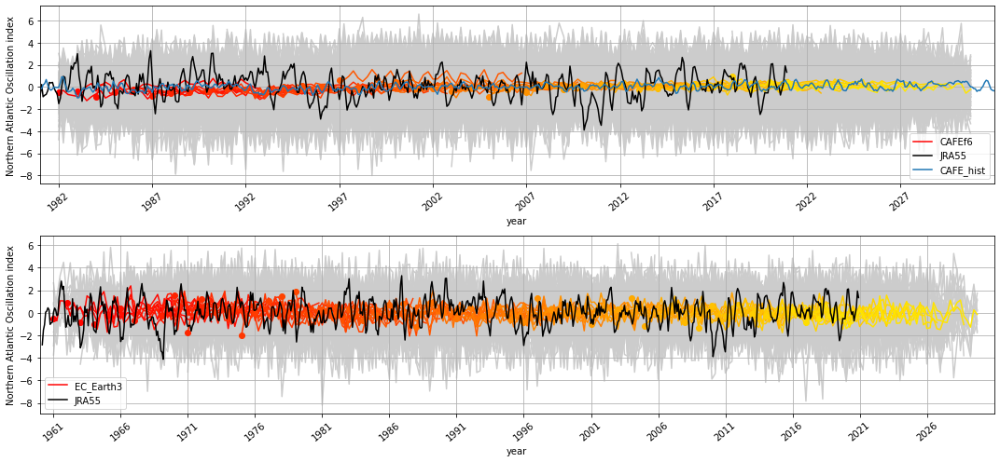

In [55]:
plot_hindcasts(
    ["CAFEf6", "EC_Earth3"],
    ["CAFE_hist"],
    ["JRA55"],
    "3-month",
    "nao",
)

### Anomaly correlation coefficient

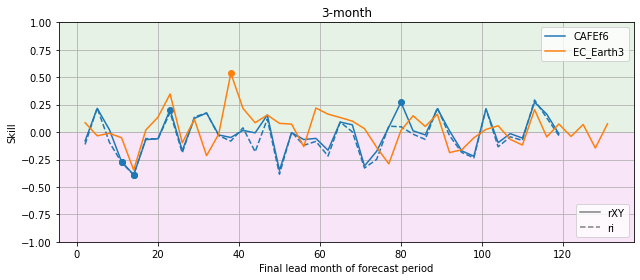

In [56]:
_ = plot_metrics(["CAFEf6", "EC_Earth3"], "JRA55", ["3-month"], "nao", ["rXY", "ri"])

### Mean squared skill score

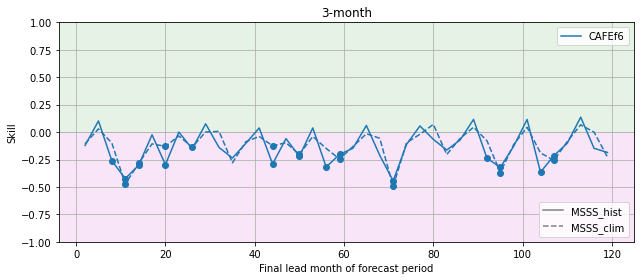

In [57]:
_ = plot_metrics(["CAFEf6"], "JRA55", ["3-month"], "nao", ["MSSS_hist", "MSSS_clim"])

### Rank probability skill score relative to historical simulations

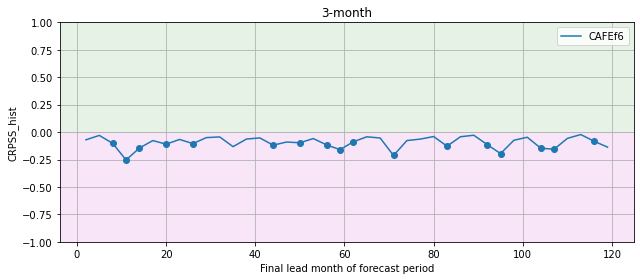

In [58]:
_ = plot_metrics(["CAFEf6"], "JRA55", ["3-month"], "nao", ["CRPSS_hist"])

## Atlantic multi-decadal variability relative to HadISST
(see https://doi.org/10.1029/2006GL026894)

### Hindcast timeseries

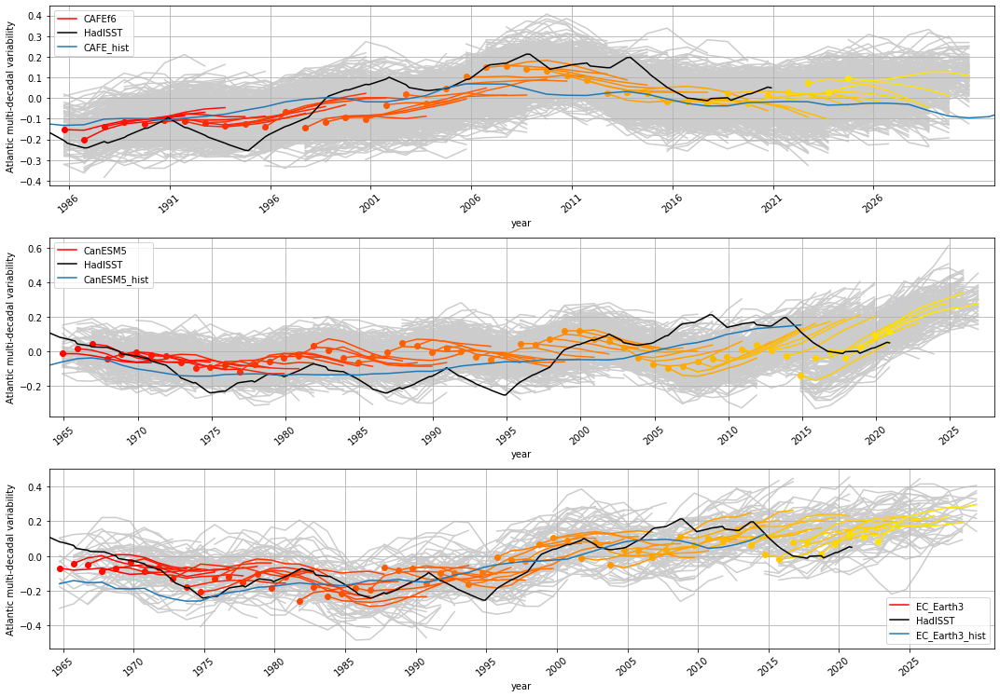

In [59]:
plot_hindcasts(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    ["CAFE_hist", "CanESM5_hist", "EC_Earth3_hist"],
    ["HadISST"],
    "4-year",
    "amv",
)

### Anomaly correlation coefficient

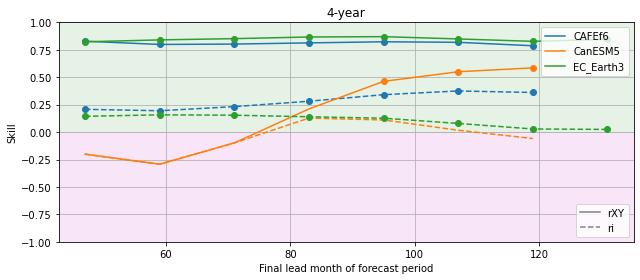

In [60]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", ["4-year"], "amv", ["rXY", "ri"]
)

### Mean squared skill score

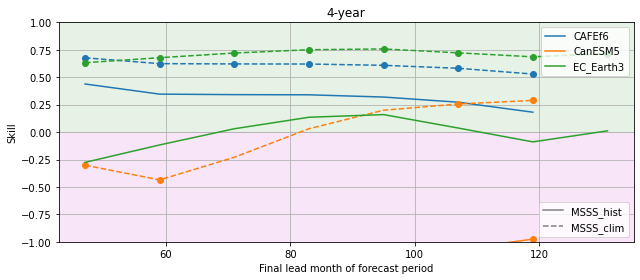

In [61]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    "HadISST",
    ["4-year"],
    "amv",
    ["MSSS_hist", "MSSS_clim"],
)

### Rank probability skill score relative to historical simulations

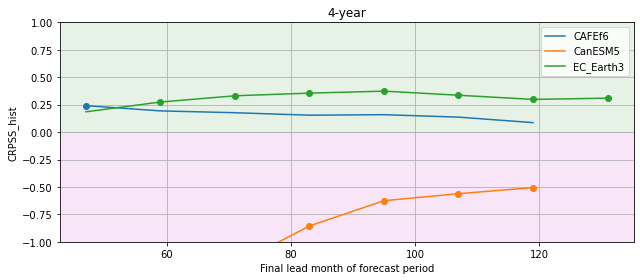

In [62]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", ["4-year"], "amv", ["CRPSS_hist"]
)

## Inter-decadal Pacific oscillation relative to HadISST
(see https://doi.org/10.1007/s00382-015-2525-1)

### Hindcast timeseries

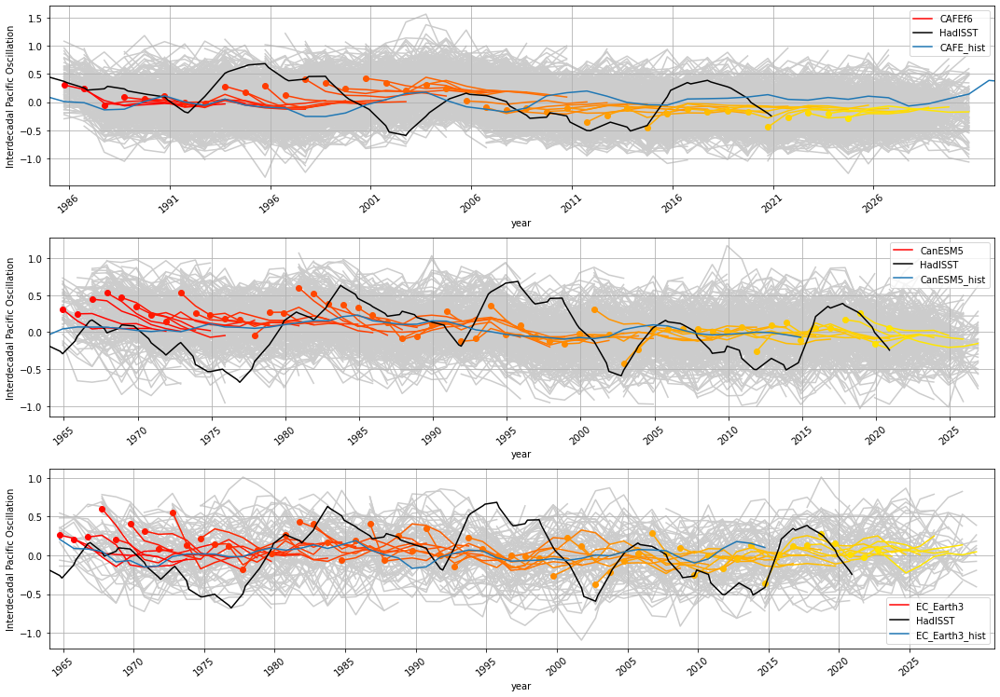

In [63]:
plot_hindcasts(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    ["CAFE_hist", "CanESM5_hist", "EC_Earth3_hist"],
    ["HadISST"],
    "4-year",
    "ipo",
)

### Anomaly correlation coefficient

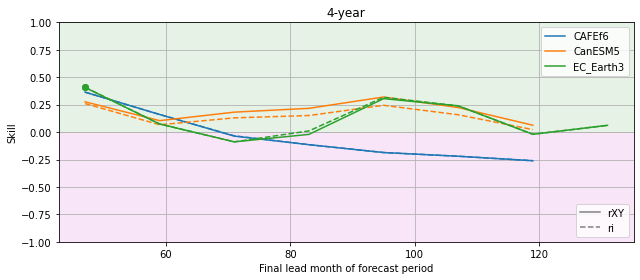

In [64]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", ["4-year"], "ipo", ["rXY", "ri"]
)

### Mean squared skill score

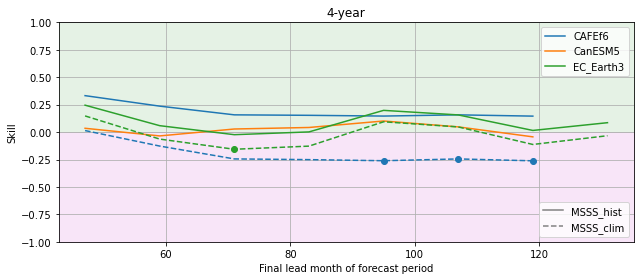

In [65]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    "HadISST",
    ["4-year"],
    "ipo",
    ["MSSS_hist", "MSSS_clim"],
)

### Rank probability skill score relative to historical simulations

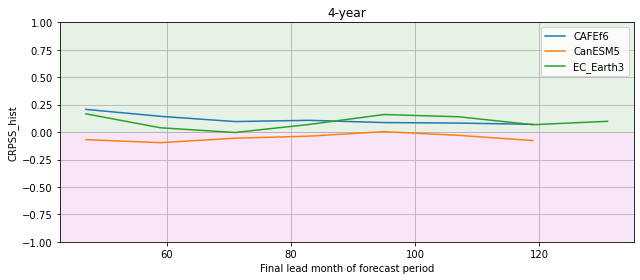

In [66]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", ["4-year"], "ipo", ["CRPSS_hist"]
)